In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.graph_objects as go
from plotly.subplots import make_subplots

!ls 

README.md           mpu6050.py          mpu_6050_plot.py    stationary_on.txt
data_analysis.ipynb mpu6050_plot_2.py   stationary.txt      stationary_on1.txt
driving.txt         mpu6050_recorder.py stationary_off.txt


# Analysing the readings recorded when driving
## Includes the following: 
- driving over potholes
- driving at constant speed (sometimes, not always because that's more of a theoretical thing. In the real world, you'd still be able to record vibrations from the running engine, uneven road, braking, turns etc.)
- standing still at red light with engine on

In [2]:
driving_df = pd.read_csv("driving.txt")
driving_df.head()

,Timestamp,Ax(m/s^2),Ay(m/s^2),Az(m/s^2),Gx(deg/s),Gy(deg/s),Gz(deg/s)
0,1.745410e+09,-0.1460,-0.0646,10.5512,-2.7252,-0.2061,0.7328
1,1.745410e+09,-0.3184,-0.0287,10.2376,-3.6947,0.6412,0.5954
2,1.745410e+09,-0.1628,0.1700,9.7181,-5.8473,0.8321,0.6489
3,1.745410e+09,-0.2490,0.0646,9.7444,-3.7023,0.3435,0.6260
4,1.745410e+09,-0.0934,-0.0934,10.6159,-3.3053,0.8779,0.3206


In [3]:
driving_df.describe()

,Timestamp,Ax(m/s^2),Ay(m/s^2),Az(m/s^2),Gx(deg/s),Gy(deg/s),Gz(deg/s)
count,9.554000e+03,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000,9554.000000
mean,1.745410e+09,-0.469858,-0.107661,9.782117,-2.027747,-0.636284,0.384861
std,2.932825e+02,0.739621,0.777090,1.583091,3.368647,6.023432,7.074356
min,1.745410e+09,-7.053300,-7.007800,-5.135600,-78.412200,-196.709900,-214.183200
25%,1.745410e+09,-0.814000,-0.459700,9.069200,-3.150775,-2.626000,-0.114500
50%,1.745410e+09,-0.457300,-0.143700,9.787500,-2.053400,-0.687000,0.358800
75%,1.745410e+09,-0.088600,0.294500,10.498600,-0.916000,1.374000,0.885500
max,1.745411e+09,19.612700,19.474400,19.612700,93.038200,72.091600,211.236600


In [4]:
print(driving_df.columns.to_list())

# Step 1 : Convert time to human-readable form
driving_df['Timestamp'] = pd.to_datetime(driving_df['Timestamp'], unit='s')
# Step 2: Localize to UTC and convert to IST
driving_df['Timestamp'] = driving_df['Timestamp'].dt.tz_localize('UTC').dt.tz_convert('Asia/Kolkata')

driving_df.set_index("Timestamp",inplace=True) 
# driving_df.reset_index(inplace=True)


['Timestamp', 'Ax(m/s^2)', 'Ay(m/s^2)', 'Az(m/s^2)', 'Gx(deg/s)', 'Gy(deg/s)', 'Gz(deg/s)']


In [5]:
driving_df.head()

,Ax(m/s^2),Ay(m/s^2),Az(m/s^2),Gx(deg/s),Gy(deg/s),Gz(deg/s)
Timestamp,,,,,,
2025-04-23 17:29:05.349800192+05:30,-0.1460,-0.0646,10.5512,-2.7252,-0.2061,0.7328
2025-04-23 17:29:05.455800064+05:30,-0.3184,-0.0287,10.2376,-3.6947,0.6412,0.5954
2025-04-23 17:29:05.561799936+05:30,-0.1628,0.1700,9.7181,-5.8473,0.8321,0.6489
2025-04-23 17:29:05.667900160+05:30,-0.2490,0.0646,9.7444,-3.7023,0.3435,0.6260
2025-04-23 17:29:05.773900032+05:30,-0.0934,-0.0934,10.6159,-3.3053,0.8779,0.3206


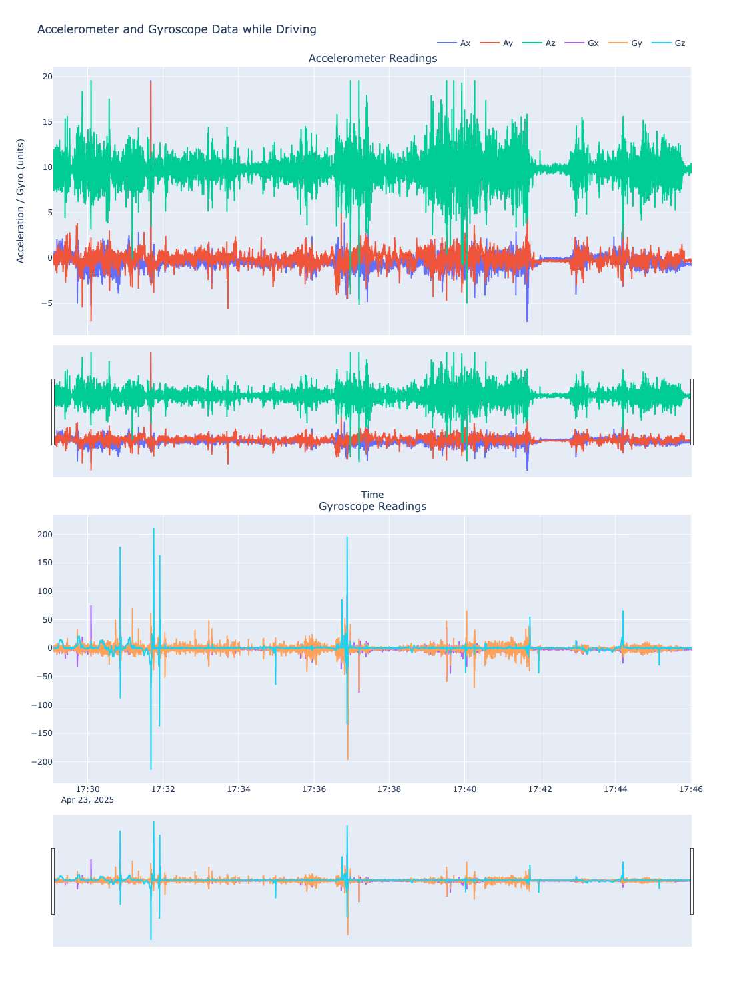

In [6]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    subplot_titles=("Accelerometer Readings", "Gyroscope Readings"))

# Accelerometer traces
fig.add_trace(go.Scatter(x=driving_df.index, y=driving_df['Ax(m/s^2)'], name='Ax', mode='lines'), row=1, col=1)

fig.add_trace(go.Scatter(x=driving_df.index, y=driving_df['Ay(m/s^2)'], name='Ay', mode='lines'), row=1, col=1)
fig.add_trace(go.Scatter(x=driving_df.index, y=driving_df['Az(m/s^2)'], name='Az', mode='lines'), row=1, col=1)

# Gyroscope traces
fig.add_trace(go.Scatter(x=driving_df.index, y=driving_df['Gx(deg/s)'], name='Gx', mode='lines'), row=2, col=1)
fig.add_trace(go.Scatter(x=driving_df.index, y=driving_df['Gy(deg/s)'], name='Gy', mode='lines'), row=2, col=1)
fig.add_trace(go.Scatter(x=driving_df.index, y=driving_df['Gz(deg/s)'], name='Gz', mode='lines'), row=2, col=1)


# Update layout
fig.update_layout(
    height=1500,
    title="Accelerometer and Gyroscope Data while Driving",
    xaxis_title="Time",
    yaxis_title="Acceleration / Gyro (units)",
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    hovermode="x unified"
)

# Enable zooming & panning
fig.update_xaxes(rangeslider_visible=True)

# Show the plot
fig.show()

# Analysing the readings recorded when ENGINE OFF
<!-- ## Includes the following:  -->

In [7]:
st_off_df = pd.read_csv('stationary_off.txt')
st_off_df.head()

,Timestamp,Ax(m/s^2),Ay(m/s^2),Az(m/s^2),Gx(deg/s),Gy(deg/s),Gz(deg/s)
0,1.745409e+09,0.1724,0.2083,9.8904,-1.8702,-0.7328,0.2519
1,1.745409e+09,0.1676,0.2394,9.8641,-1.9466,-0.5725,0.1679
2,1.745409e+09,0.2274,0.2131,9.9144,-1.8321,-0.8092,0.4885
3,1.745409e+09,0.1580,0.1915,9.8210,-2.0458,-0.7405,0.3053
4,1.745409e+09,0.1317,0.2274,9.8330,-2.0534,-0.6870,0.1527


In [8]:
st_off_df.describe()

,Timestamp,Ax(m/s^2),Ay(m/s^2),Az(m/s^2),Gx(deg/s),Gy(deg/s),Gz(deg/s)
count,6.360000e+02,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000
mean,1.745409e+09,0.158450,0.222256,9.844916,-2.030535,-0.636162,0.273505
std,1.953961e+01,0.067243,0.034752,0.062125,0.641296,0.118433,0.273121
min,1.745409e+09,0.000000,0.019200,9.653400,-3.908400,-1.045800,-1.916000
25%,1.745409e+09,0.122100,0.200500,9.815600,-2.114500,-0.717600,0.196575
50%,1.745409e+09,0.158000,0.222700,9.847400,-2.053400,-0.633600,0.282400
75%,1.745409e+09,0.196300,0.244200,9.885700,-1.969500,-0.557300,0.366400
max,1.745409e+09,0.304100,0.409400,10.022100,-0.007600,-0.290100,1.946600


In [9]:
st_off_df['Timestamp'] = pd.to_datetime(st_off_df['Timestamp'], unit='s') # convert timestamp to human readable

In [10]:
 # convert to IST
st_off_df['Timestamp'] = st_off_df['Timestamp'].dt.tz_localize('UTC').dt.tz_convert('Asia/Kolkata')
 #  Set Timestamp as index of the df
st_off_df.set_index('Timestamp',inplace =True)


st_off_df.head()

,Ax(m/s^2),Ay(m/s^2),Az(m/s^2),Gx(deg/s),Gy(deg/s),Gz(deg/s)
Timestamp,,,,,,
2025-04-23 17:24:54.956199936+05:30,0.1724,0.2083,9.8904,-1.8702,-0.7328,0.2519
2025-04-23 17:24:55.062299904+05:30,0.1676,0.2394,9.8641,-1.9466,-0.5725,0.1679
2025-04-23 17:24:55.168400128+05:30,0.2274,0.2131,9.9144,-1.8321,-0.8092,0.4885
2025-04-23 17:24:55.274599936+05:30,0.1580,0.1915,9.8210,-2.0458,-0.7405,0.3053
2025-04-23 17:24:55.380700160+05:30,0.1317,0.2274,9.8330,-2.0534,-0.6870,0.1527


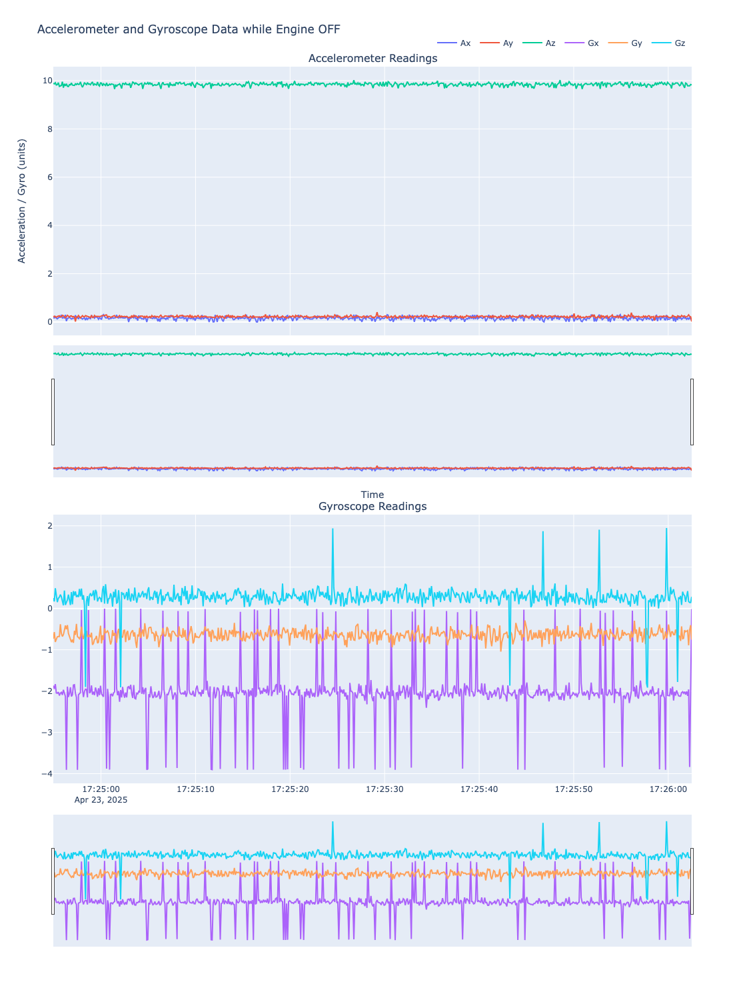

In [11]:
fig2 = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    subplot_titles=("Accelerometer Readings", "Gyroscope Readings"))

# Accelerometer traces
fig2.add_trace(go.Scatter(x=st_off_df.index, y=st_off_df['Ax(m/s^2)'], name='Ax', mode='lines'), row=1, col=1)

fig2.add_trace(go.Scatter(x=st_off_df.index, y=st_off_df['Ay(m/s^2)'], name='Ay', mode='lines'), row=1, col=1)
fig2.add_trace(go.Scatter(x=st_off_df.index, y=st_off_df['Az(m/s^2)'], name='Az', mode='lines'), row=1, col=1)

# Gyroscope traces
fig2.add_trace(go.Scatter(x=st_off_df.index, y=st_off_df['Gx(deg/s)'], name='Gx', mode='lines'), row=2, col=1)
fig2.add_trace(go.Scatter(x=st_off_df.index, y=st_off_df['Gy(deg/s)'], name='Gy', mode='lines'), row=2, col=1)
fig2.add_trace(go.Scatter(x=st_off_df.index, y=st_off_df['Gz(deg/s)'], name='Gz', mode='lines'), row=2, col=1)


# Update layout
fig2.update_layout(
    height=1500,
    title="Accelerometer and Gyroscope Data when Engine OFF",
    xaxis_title="Time",
    yaxis_title="Acceleration / Gyro (units)",
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    hovermode="x unified"
)

# Enable zooming & panning
fig2.update_xaxes(rangeslider_visible=True)

# Show the plot
fig2.show()

# Analysing the readings recorded when ENGINE ON but VELOCITY = 0

In [12]:
st_on_df = pd.read_csv('stationary_on.txt')
st_on_df.head()

,Timestamp,Ax(m/s^2),Ay(m/s^2),Az(m/s^2),Gx(deg/s),Gy(deg/s),Gz(deg/s)
0,1.745409e+09,0.5698,0.9026,7.9631,-5.3435,4.1069,-0.0840
1,1.745409e+09,0.3424,0.7039,8.3510,-5.9237,4.6794,-0.0534
2,1.745409e+09,0.5818,0.4621,9.3158,-5.3969,3.9771,1.8931
3,1.745409e+09,0.4788,0.3328,9.9096,-5.4198,4.1298,1.8855
4,1.745409e+09,0.1724,0.0215,10.2807,-4.9237,3.7405,0.3435


In [13]:
st_on_df.describe()

,Timestamp,Ax(m/s^2),Ay(m/s^2),Az(m/s^2),Gx(deg/s),Gy(deg/s),Gz(deg/s)
count,6.730000e+02,673.000000,673.000000,673.000000,673.000000,673.000000,673.000000
mean,1.745409e+09,0.141178,0.214172,9.878396,-2.061873,-0.695395,0.300947
std,2.067382e+01,0.171510,0.223596,0.636370,1.004480,1.536694,0.381954
min,1.745409e+09,-0.351900,-0.799700,7.398100,-5.923700,-6.305300,-1.946600
25%,1.745409e+09,0.023900,0.076600,9.512200,-2.542000,-1.572500,0.198500
50%,1.745409e+09,0.143700,0.229800,9.840200,-2.084000,-0.656500,0.290100
75%,1.745409e+09,0.261000,0.342400,10.249600,-1.526700,0.213700,0.404600
max,1.745409e+09,0.641600,1.041500,12.564800,1.908400,4.679400,1.946600


In [14]:
st_on_df['Timestamp'] = pd.to_datetime(st_on_df['Timestamp'], unit='s') # convert timestamp to human readable

In [15]:
 # convert to IST
st_on_df['Timestamp'] = st_on_df['Timestamp'].dt.tz_localize('UTC').dt.tz_convert('Asia/Kolkata')
 #  Set Timestamp as index of the df
st_on_df.set_index('Timestamp',inplace =True)


st_on_df.head()

,Ax(m/s^2),Ay(m/s^2),Az(m/s^2),Gx(deg/s),Gy(deg/s),Gz(deg/s)
Timestamp,,,,,,
2025-04-23 17:26:32.155100160+05:30,0.5698,0.9026,7.9631,-5.3435,4.1069,-0.0840
2025-04-23 17:26:32.261100032+05:30,0.3424,0.7039,8.3510,-5.9237,4.6794,-0.0534
2025-04-23 17:26:32.367200+05:30,0.5818,0.4621,9.3158,-5.3969,3.9771,1.8931
2025-04-23 17:26:32.473200128+05:30,0.4788,0.3328,9.9096,-5.4198,4.1298,1.8855
2025-04-23 17:26:32.579299840+05:30,0.1724,0.0215,10.2807,-4.9237,3.7405,0.3435


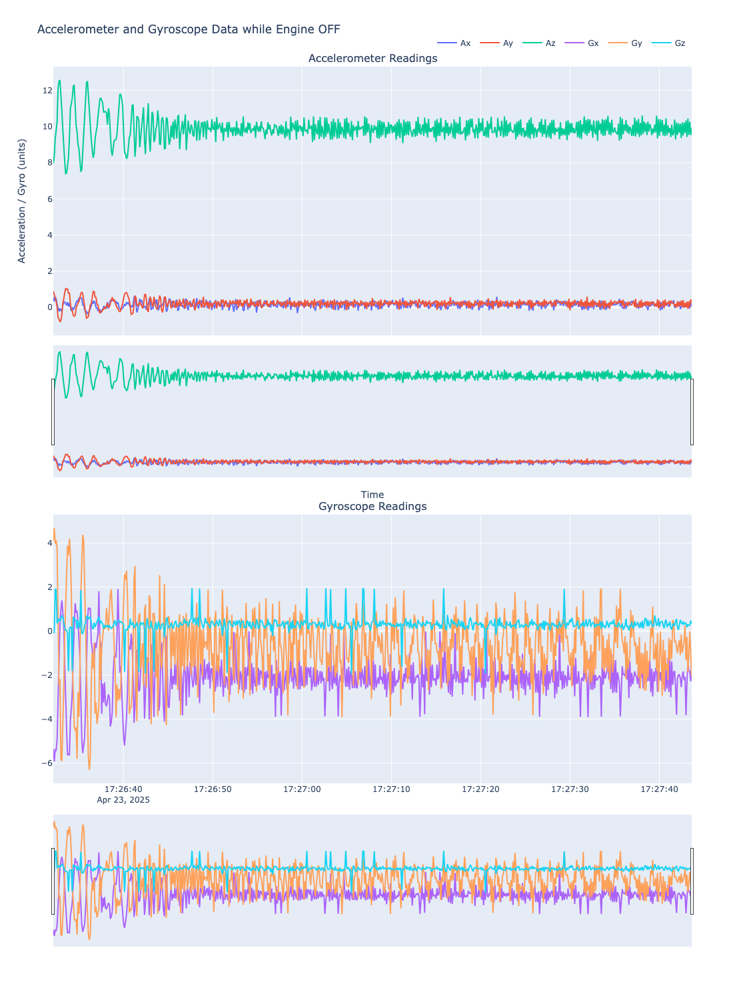

In [16]:
fig3 = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    subplot_titles=("Accelerometer Readings", "Gyroscope Readings"))

# Accelerometer traces
fig3.add_trace(go.Scatter(x=st_on_df.index, y=st_on_df['Ax(m/s^2)'], name='Ax', mode='lines'), row=1, col=1)

fig3.add_trace(go.Scatter(x=st_on_df.index, y=st_on_df['Ay(m/s^2)'], name='Ay', mode='lines'), row=1, col=1)
fig3.add_trace(go.Scatter(x=st_on_df.index, y=st_on_df['Az(m/s^2)'], name='Az', mode='lines'), row=1, col=1)

# Gyroscope traces
fig3.add_trace(go.Scatter(x=st_on_df.index, y=st_on_df['Gx(deg/s)'], name='Gx', mode='lines'), row=2, col=1)
fig3.add_trace(go.Scatter(x=st_on_df.index, y=st_on_df['Gy(deg/s)'], name='Gy', mode='lines'), row=2, col=1)
fig3.add_trace(go.Scatter(x=st_on_df.index, y=st_on_df['Gz(deg/s)'], name='Gz', mode='lines'), row=2, col=1)


# Update layout
fig3.update_layout(
    height=1500,
    title="Accelerometer and Gyroscope Data while Engine ON",
    xaxis_title="Time",
    yaxis_title="Acceleration / Gyro (units)",
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    hovermode="x unified"
)

# Enable zooming & panning
fig3.update_xaxes(rangeslider_visible=True)

# Show the plot
fig3.show()

In [38]:

WINDOW_SIZE = 100 # Example: Adjust this!

def calculate_rolling_variance(df, window_size):
    cols_accel = ['Ax(m/s^2)', 'Ay(m/s^2)', 'Az(m/s^2)']
    cols_gyro = ['Gx(deg/s)', 'Gy(deg/s)', 'Gz(deg/s)']
    # Calculate variance for each axis
    for col in cols_accel + cols_gyro:
        df[f'{col}_var'] = df[col].rolling(window=window_size).var()
    # Calculate combined variance (summing axis variances often works well)
    df['accel_total_var'] = df[[f'{col}_var' for col in cols_accel]].sum(axis=1)
    df['gyro_total_var'] = df[[f'{col}_var' for col in cols_gyro]].sum(axis=1)
    # Optional: Calculate magnitude variance too
    # df['accel_mag'] = np.sqrt(df['Ax(m/s^2)']**2 + df['Ay(m/s^2)']**2 + df['Az(m/s^2)']**2)
    # df['accel_mag_var'] = df['accel_mag'].rolling(window=window_size).var()
    return df.dropna() # Drop initial rows where variance is NaN

# Apply to your loaded dataframes
driving_var = calculate_rolling_variance(driving_df, WINDOW_SIZE)
st_on_var = calculate_rolling_variance(st_on_df, WINDOW_SIZE)
st_off_var = calculate_rolling_variance(st_off_df, WINDOW_SIZE)

Suggested starting threshold (99th percentile of Stationary ON variance): 1.9152


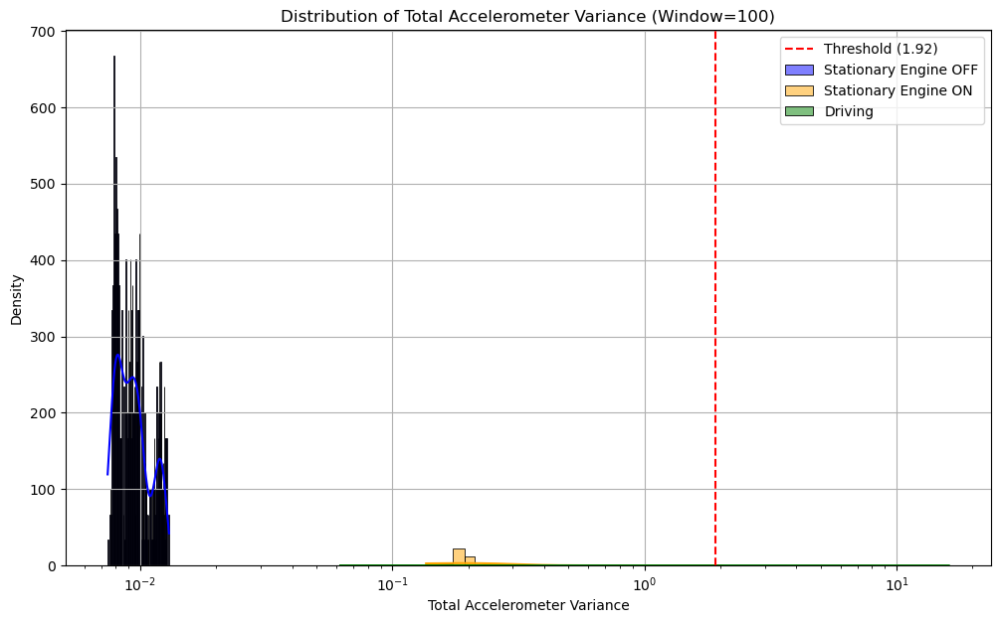

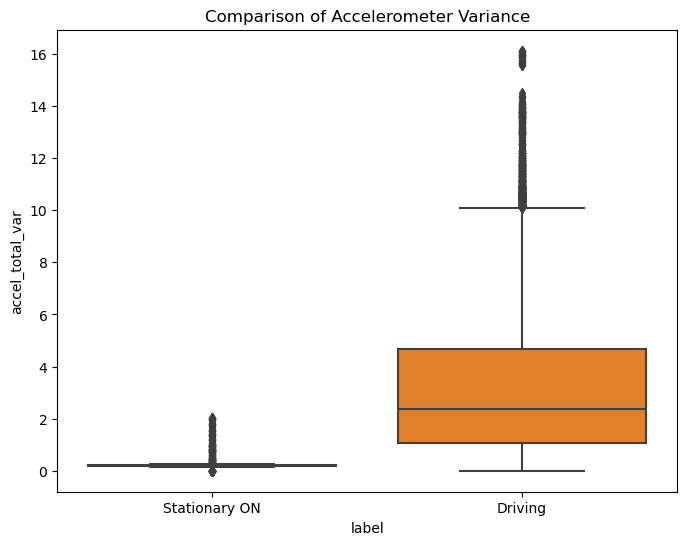

In [39]:
# In your data_analysis.ipynb
import matplotlib.pyplot as plt
import seaborn as sns # Or use plotly histograms

plt.figure(figsize=(12, 7))
sns.histplot(st_off_var['accel_total_var'], color='blue', label='Stationary Engine OFF', kde=True, stat="density", bins=100)
sns.histplot(st_on_var['accel_total_var'], color='orange', label='Stationary Engine ON', kde=True, stat="density", bins=100)
sns.histplot(driving_var['accel_total_var'], color='green', label='Driving', kde=True, stat="density", bins=100)


# Calculate potential threshold
potential_threshold = st_on_df['accel_total_var'].quantile(0.99) # 99th percentile
print(f"Suggested starting threshold (99th percentile of Stationary ON variance): {potential_threshold:.4f}")
plt.axvline(potential_threshold, color='red', linestyle='--', label=f'Threshold ({potential_threshold:.2f})')

plt.title(f'Distribution of Total Accelerometer Variance (Window={WINDOW_SIZE})')
plt.xlabel('Total Accelerometer Variance')
plt.ylabel('Density')
plt.xscale('log') # Log scale might help visualize separation if values vary widely
plt.legend()
plt.grid(True)
plt.show()

# --- Box plots can also be very informative ---
# Combine relevant parts of dataframes for easier plotting
st_on_df['label'] = 'Stationary ON'
driving_df['label'] = 'Driving'
combined_df = pd.concat([st_on_df[['accel_total_var', 'label']], driving_df[['accel_total_var', 'label']]])

plt.figure(figsize=(8, 6))
sns.boxplot(x='label', y='accel_total_var', data=combined_df)
plt.title('Comparison of Accelerometer Variance')
# plt.yscale('log')
plt.show()